### **Import the dataset**

In [1]:
!pip3 install scikit-learn

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df = pd.read_csv("datasets/Bank_Market_Dataset.csv")
df.head(5)

,Unnamed: 0,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [4]:
df = df.drop(columns= "Unnamed: 0")
df.head(5)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [6]:
num_cols = df.select_dtypes(include=["int64"]).columns
object_cols = df.select_dtypes(include=["object"]).columns

In [7]:
num_cols

Index(['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous'], dtype='object')

In [8]:
# remove the y from object_cols
object_cols = object_cols[:-1]

In [9]:
object_cols

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'poutcome'],
      dtype='object')

In [10]:
#convert the target variable to binary
df["y"] = df["y"].apply(lambda x: 1 if x == "yes" else 0)

In [11]:
df.describe()

,age,balance,day,duration,campaign,pdays,previous,y
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323,0.116985
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441,0.321406
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000,1.000000


### **Preprocess the dataset**

In [12]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Impute numerical columns with mean
num_imputer = SimpleImputer(strategy="mean")
df[num_cols] = num_imputer.fit_transform(df[num_cols])

# Scale numerical columns
scaler = StandardScaler()
df[num_cols] = scaler.fit_transform(df[num_cols])

In [13]:
# Impute object columns with most frequent value
obj_imputer = SimpleImputer(strategy="most_frequent")
df[object_cols] = obj_imputer.fit_transform(df[object_cols])

# Encode object columns
label_encoders = {}
for col in object_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

df.head()
# Split the dataset into X and y
X = df.drop(columns=["y"])
y = df["y"]

feature_names = X.columns

df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,1.606965,4,1,2,0,0.256419,1,0,2,-1.298476,8,0.011016,-0.569351,-0.411453,-0.25194,3,0
1,0.288529,9,2,1,0,-0.437895,1,0,2,-1.298476,8,-0.416127,-0.569351,-0.411453,-0.25194,3,0
2,-0.747384,2,1,1,0,-0.446762,1,1,2,-1.298476,8,-0.707361,-0.569351,-0.411453,-0.25194,3,0
3,0.571051,1,1,3,0,0.047205,1,0,2,-1.298476,8,-0.645231,-0.569351,-0.411453,-0.25194,3,0
4,-0.747384,11,2,3,0,-0.447091,0,0,2,-1.298476,8,-0.233620,-0.569351,-0.411453,-0.25194,3,0


In [14]:
X.shape

(45211, 16)

In [15]:
X_copy = X.copy()
y_copy = y.copy()

### **Ready the model inputs**

In [16]:
# uncomment this to install PyTorch for Apple Silicon

!pip3 install --pre torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/nightly/cpu

Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/nightly/cpu


In [17]:
#convert the data to tensors
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import torch.optim as optim

X = X.values

X_tensor = torch.tensor(X, dtype=torch.float32)
y_tensor = torch.tensor(y.values, dtype=torch.int64)

In [18]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_tensor, y_tensor, test_size=0.2, random_state=42)

In [19]:
#just to verify the shape and data type :)

print(X_train.shape)
print(X_train.dtype)

torch.Size([36168, 16])
torch.float32


In [20]:
#save the training and testing data to use in another file
torch.save(X_train, "X_train.pt")
torch.save(X_test, "X_test.pt")
torch.save(y_train, "y_train.pt")
torch.save(y_test, "y_test.pt")

In [21]:
#create TensorDatasets

trainDataset = TensorDataset(X_train, y_train)
testDataset = TensorDataset(X_test, y_test)

#creating the DataLoaders

trainLoader = DataLoader(trainDataset, batch_size= 2, shuffle=True)
testLoader = DataLoader(testDataset, batch_size=2, shuffle=True)

### **Define the Feed-Forward Neural Network**

In [22]:
class FeedForwardNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(FeedForwardNetwork, self).__init__()
        self.network = nn.Sequential(
            nn.Linear(input_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, output_size)
        )
    def forward(self, x):
        return self.network(x)

In [23]:
#configure the model

input_size = X_train.shape[1]
hidden_size = 32
output_size = 2

model = FeedForwardNetwork(input_size, hidden_size, output_size)

In [24]:
# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [25]:
# Train the model
epochs = 25
for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    for X_batch, y_batch in trainLoader:
        outputs = model(X_batch)
        loss = criterion(outputs, y_batch)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += y_batch.size(0)
        correct += (predicted == y_batch).sum().item()
    
    epoch_loss = running_loss / len(trainLoader)
    epoch_accuracy = correct / total
    print(f"Epoch {epoch+1}, Loss: {epoch_loss:.4f}, Accuracy: {epoch_accuracy:.4f}")

# Evaluate the model
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for X_batch, y_batch in testLoader:
        outputs = model(X_batch)
        _, predicted = torch.max(outputs, 1)
        total += y_batch.size(0)
        correct += (predicted == y_batch).sum().item()

test_accuracy = correct / total
print(f"Test Accuracy: {test_accuracy:.4f}")

# Save the model
torch.save(model.state_dict(), "feedforward.pt")



Epoch 1, Loss: 0.2521, Accuracy: 0.8944
Epoch 2, Loss: 0.2351, Accuracy: 0.8992
Epoch 3, Loss: 0.2322, Accuracy: 0.9002
Epoch 4, Loss: 0.2310, Accuracy: 0.9005
Epoch 5, Loss: 0.2290, Accuracy: 0.9018
Epoch 6, Loss: 0.2289, Accuracy: 0.9022
Epoch 7, Loss: 0.2282, Accuracy: 0.9018
Epoch 8, Loss: 0.2276, Accuracy: 0.9029
Epoch 9, Loss: 0.2261, Accuracy: 0.9036
Epoch 10, Loss: 0.2253, Accuracy: 0.9033
Epoch 11, Loss: 0.2264, Accuracy: 0.9025
Epoch 12, Loss: 0.2245, Accuracy: 0.9026
Epoch 13, Loss: 0.2249, Accuracy: 0.9032
Epoch 14, Loss: 0.2242, Accuracy: 0.9043
Epoch 15, Loss: 0.2239, Accuracy: 0.9035
Epoch 16, Loss: 0.2228, Accuracy: 0.9038
Epoch 17, Loss: 0.2234, Accuracy: 0.9051
Epoch 18, Loss: 0.2231, Accuracy: 0.9045
Epoch 19, Loss: 0.2223, Accuracy: 0.9045
Epoch 20, Loss: 0.2224, Accuracy: 0.9047
Epoch 21, Loss: 0.2226, Accuracy: 0.9048
Epoch 22, Loss: 0.2226, Accuracy: 0.9044
Epoch 23, Loss: 0.2214, Accuracy: 0.9039
Epoch 24, Loss: 0.2216, Accuracy: 0.9040
Epoch 25, Loss: 0.2229, A

In [26]:
#show the information of the model

model.eval()

FeedForwardNetwork(
  (network): Sequential(
    (0): Linear(in_features=16, out_features=32, bias=True)
    (1): ReLU()
    (2): Linear(in_features=32, out_features=2, bias=True)
  )
)

In [27]:
import quantus
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch.optim as optim
import captum
from captum.attr import IntegratedGradients, InputXGradient, GradientShap

#suppress warnings
import warnings
warnings.filterwarnings("ignore")

#check what XAI models are available
available_methods = quantus.AVAILABLE_XAI_METHODS_CAPTUM
print("Available XAI Methods:", available_methods)

Available XAI Methods: ['GradientShap', 'IntegratedGradients', 'DeepLift', 'DeepLiftShap', 'InputXGradient', 'Saliency', 'FeatureAblation', 'Deconvolution', 'FeaturePermutation', 'Lime', 'KernelShap', 'LRP', 'Gradient', 'Occlusion', 'LayerGradCam', 'GuidedGradCam', 'LayerConductance', 'LayerActivation', 'InternalInfluence', 'LayerGradientXActivation', 'Control Var. Sobel Filter', 'Control Var. Constant', 'Control Var. Random Uniform']


/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [28]:
# Calculate train accuracy
out_probs = model(X_train).detach().numpy()
out_classes = np.argmax(out_probs, axis=1)
train_accuracy = np.sum(out_classes == y_train.numpy()) / len(y_train)
print("Train Accuracy:", train_accuracy)

# Calculate test accuracy
out_probs = model(X_test).detach().numpy()
out_classes = np.argmax(out_probs, axis=1)
test_accuracy = np.sum(out_classes == y_test.numpy()) / len(y_test)
print("Test Accuracy:", test_accuracy)

Train Accuracy: 0.9062430878124309
Test Accuracy: 0.8998120092889528


In [29]:
ig = IntegratedGradients(model)

X_test.requires_grad_()
attr, delta = ig.attribute(X_test, target=1, return_convergence_delta=True)
attr = attr.detach().numpy()

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome'],
      dtype='object')
Average Feature Importances from IntegratedGradients
age :  0.091
job :  -0.144
marital :  0.010
education :  0.145
default :  -0.034
balance :  -0.167
housing :  -0.400
loan :  -0.092
contact :  -0.409
day :  -0.044
month :  0.467
duration :  -0.512
campaign :  -0.051
pdays :  -0.313
previous :  -0.163
poutcome :  -0.138


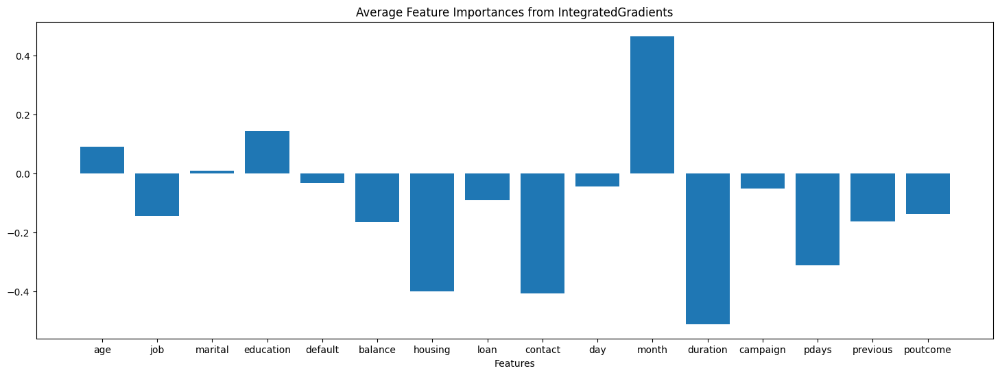

In [30]:
#get the feature names for the dataset from the tensor
print(feature_names)

# Helper method to print importances and visualize distribution
def visualize_importances(feature_names, importances, title="Average Feature Importances from IntegratedGradients", plot=True, axis_title="Features"):
    print(title)
    for i in range(len(feature_names)):
        print(feature_names[i], ": ", '%.3f'%(importances[i]))
    x_pos = (np.arange(len(feature_names)))
    if plot:
        plt.figure(figsize=(18,6))
        plt.bar(x_pos, importances, align='center')
        plt.xticks(x_pos, feature_names, wrap=True)
        plt.xlabel(axis_title)
        plt.title(title)
visualize_importances(feature_names, np.mean(attr, axis=0))

In [31]:
gradientShapExplainer = GradientShap(model)

X_test.requires_grad_()
baselines = X_train.mean(dim=0).unsqueeze(0).repeat(X_test.size(0), 1)
attr, delta = gradientShapExplainer.attribute(X_test, target=1, return_convergence_delta=True, baselines= baselines)
attr = attr.detach().numpy()

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome'],
      dtype='object')
Average Feature Importances from GradientShap
age :  0.105
job :  -0.018
marital :  0.010
education :  -0.029
default :  -0.025
balance :  -0.177
housing :  -0.092
loan :  -0.008
contact :  -0.183
day :  -0.028
month :  -0.030
duration :  -0.411
campaign :  -0.046
pdays :  -0.250
previous :  -0.122
poutcome :  -0.167


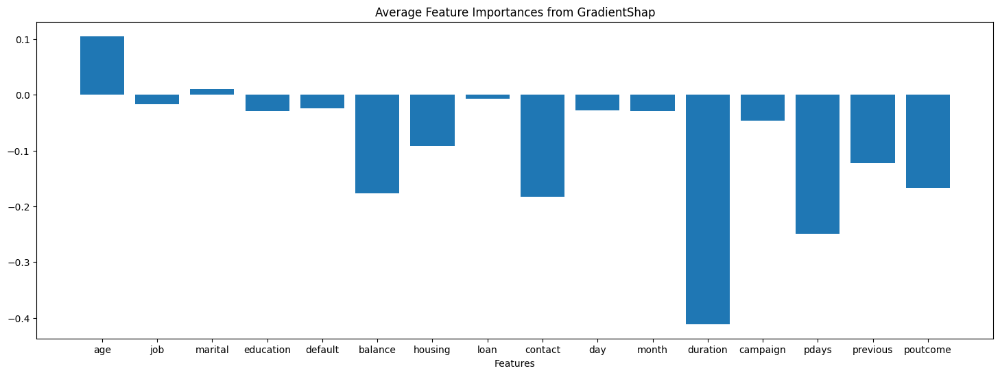

In [32]:
#get the feature names for the dataset from the tensor
print(feature_names)

# Helper method to print importances and visualize distribution
def visualize_importances(feature_names, importances, title="Average Feature Importances from GradientShap", plot=True, axis_title="Features"):
    print(title)
    for i in range(len(feature_names)):
        print(feature_names[i], ": ", '%.3f'%(importances[i]))
    x_pos = (np.arange(len(feature_names)))
    if plot:
        plt.figure(figsize=(18,6))
        plt.bar(x_pos, importances, align='center')
        plt.xticks(x_pos, feature_names, wrap=True)
        plt.xlabel(axis_title)
        plt.title(title)
visualize_importances(feature_names, np.mean(attr, axis=0))

In [33]:
ixgradients = InputXGradient(model)

X_test.requires_grad_()
attr= ixgradients.attribute(X_test, target=1)
attr = attr.detach().numpy()

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome'],
      dtype='object')
Average Feature Importances from InputXGradients
age :  0.158
job :  -0.082
marital :  0.102
education :  0.125
default :  -0.047
balance :  -0.187
housing :  -0.387
loan :  -0.109
contact :  -0.579
day :  -0.094
month :  0.339
duration :  -0.858
campaign :  -0.070
pdays :  -0.327
previous :  -0.172
poutcome :  -0.159


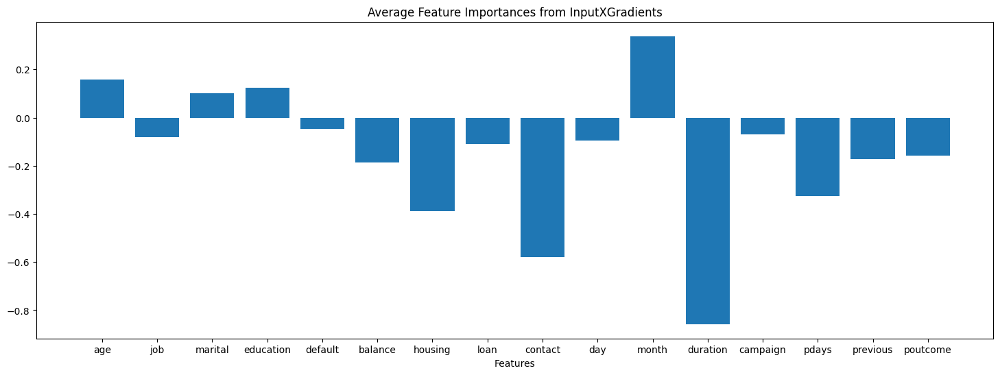

In [34]:
#get the feature names for the dataset from the tensor
print(feature_names)

# Helper method to print importances and visualize distribution
def visualize_importances(feature_names, importances, title="Average Feature Importances from InputXGradients", plot=True, axis_title="Features"):
    print(title)
    for i in range(len(feature_names)):
        print(feature_names[i], ": ", '%.3f'%(importances[i]))
    x_pos = (np.arange(len(feature_names)))
    if plot:
        plt.figure(figsize=(18,6))
        plt.bar(x_pos, importances, align='center')
        plt.xticks(x_pos, feature_names, wrap=True)
        plt.xlabel(axis_title)
        plt.title(title)
visualize_importances(feature_names, np.mean(attr, axis=0))

Using LIME

In [35]:
!pip3 install lime

In [67]:
import lime
from lime.lime_tabular import LimeTabularExplainer

Use Lime only for the correctly predicted value to ensure meaningful and reliable insights.

In [68]:
#predict the target value for this particular instance

i = 99
instance = X_copy.loc[i, X_copy.columns].values
instance = torch.tensor(instance, dtype=torch.float32).reshape(1, -1)

model.eval()
with torch.no_grad():
    output = model(instance)
    _, predicted_class = torch.max(output, 1)
    print(f"Predicted class for the instance: {predicted_class.item()}")


Predicted class for the instance: 0


In [69]:
limeExplainer = LimeTabularExplainer(X_test.detach().numpy(), mode="classification", feature_names=feature_names, class_names=["no (0)", "yes (1)"])

In [70]:
predict_fn = lambda x: model(torch.tensor(x, dtype=torch.float32)).detach().numpy()

i = 99
exp=limeExplainer.explain_instance(X_copy.loc[i,X_copy.columns].astype(int).values, predict_fn, num_features=16)
exp.show_in_notebook(show_table=True)

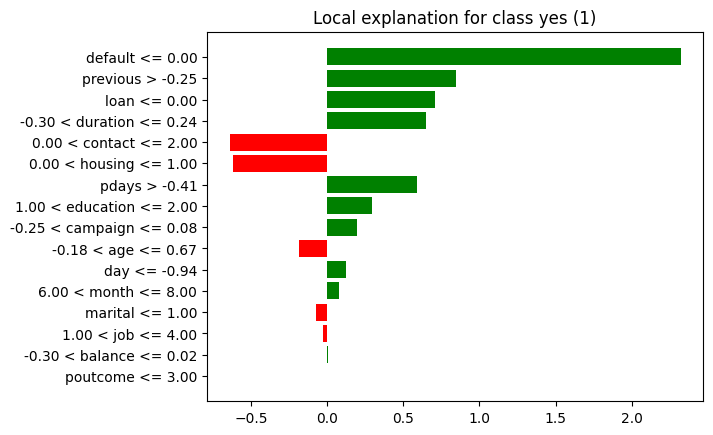

In [71]:

%matplotlib inline
fig = exp.as_pyplot_figure();

### **Global Interpretability using LIME**

In [75]:
from lime import submodular_pick


sp_exp = submodular_pick.SubmodularPick(limeExplainer, 
                                        df[X_copy.columns].values,
                                        predict_fn, 
                                        num_features=16,
                                        num_exps_desired=5)

In [81]:
[sp_exp.sp_explanations[i].show_in_notebook(show_table= True) for i in range(5)]

[None, None, None, None, None]

## **Analysis**